In [2]:
import pandas as pd
import os
import glob
import numpy as np
from nilearn import plotting
from nilearn.input_data import NiftiLabelsMasker

from nilearn import datasets

data_dir = None # change this variable with the path where you want nilearn to download
                # the data, if you leave None, the default will be '~/nilearn_data'
    
# Loading the functional datasets
data = datasets.fetch_development_fmri(n_subjects=1, data_dir=data_dir)

# you can use the .keys() method to check what's in the dataset
data.keys()
from nilearn.connectome import ConnectivityMeasure
from nilearn.interfaces.fmriprep import load_confounds
from nilearn.interfaces.fmriprep import load_confounds_strategy
from nilearn.input_data import NiftiMapsMasker
from nilearn.input_data import NiftiMasker

### Atlas

atlas_dataset = datasets.fetch_atlas_msdl(data_dir=data_dir)
atlas_filepath = atlas_dataset.maps
labels = atlas_dataset.labels

### Fonctions

###selectionne la run avec la framewise_displacement moyenne la plus faible pour un sujet donné
def less_motion(path_subj):  
    dic = {}
    res = 0
    mini = float("inf")
    liste_tsv=glob.glob('{}/*/*/*timeseries.tsv'.format(path_subj))
    for i in liste_tsv:
        dic[i] = pd.read_csv(i, sep='\t')
    for k in dic:
        moy = dic[k]['framewise_displacement'].mean()
        if moy < mini:
            mini = moy
            run = k
            df = dic[k]
            bold = "{}space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz".format(run[0:-29])
    return bold

def make_connectome(fmri_filepath): ### création du connectome
    confounds_ica, sample_mask = load_confounds(    ### gestion des confounds
        fmri_filepath,
        strategy=["high_pass", "motion", "wm_csf", "ica_aroma"],
        motion="basic", wm_csf="basic", ica_aroma="full")

    atlas_masker = NiftiLabelsMasker(labels_img=mistatlas_filepath, standardize=True)
    data_in_atlas = atlas_masker.fit_transform(fmri_filepath, confounds=confounds_ica)
    correlation_measure = ConnectivityMeasure(kind='correlation')
    correlation_matrix = correlation_measure.fit_transform([data_in_atlas])[0]
    
    return correlation_matrix

def plot_matrix(matrix):  ### affiche la matrice de correlation
    # Make a large figure
    # Mask the main diagonal for visualization:
    np.fill_diagonal(matrix, 0)
    # The matrix is reordered for block-like representation
    plotting.plot_matrix(matrix, figure=(10, 8), labels=mistatlas_labels,
                     vmax=0.8, vmin=-0.8, reorder=False, title = "{}".format(i))

### retourne une liste de chemin vers les sujets    
def create_path_subj(list_subj): 
    list_path = []
    for i in list_subj:
        list_path.append('{}/sub-{}'.format(path, i))
    return list_path

### retourne un dictionnaire comportant la meilleure run pour chaque sujet
def create_dictbold_motionless(list_path):    dict_bold_motionless = {}
    for sub in list_path:
        dict_bold_motionless[sub[-8:]] = less_motion(path_subj = sub)
    return dict_bold_motionless

### retourne un dictionnaire associant chaque sujet à son connectome
def create_dict_connectome(dict_bold_motionless):
    dict_connectome = {}
    for i in dict_bold_motionless:
        dict_connectome[i] = make_connectome(dict_bold_motionless[i])
    return dict_connectome

/home/pierre/.local/lib/python3.9/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [3]:
mistatlas_filepath = "/home/pierre/Documents/MIST_parcellation/Parcellations/MIST_64.nii.gz"
mistatlas_labels = pd.read_csv("/home/pierre/Documents/MIST_parcellation/Parcel_Information/MIST_64.csv", sep = ";")["label"].values.tolist()
coordinates = plotting.find_parcellation_cut_coords(labels_img=mistatlas_filepath)

In [4]:
print(atlas_dataset.maps)

/home/pierre/nilearn_data/msdl_atlas/MSDL_rois/msdl_rois.nii


In [5]:
path = "/home/pierre/Documents/export/iso+tfe"

liste_path_sub = glob.glob('{}/sub*/'.format(path))
liste_path_sub = sorted(liste_path_sub)

### mise en place d'une banlist pour exclure les sujets n'ayant pas pu être preprocessé (pas de func)
banlist = []
for i in liste_path_sub:
    if not glob.glob("{}/*/func/*bold.nii.gz".format(i)):
        banlist.append(i[-5:-1])
banlist.append('0200')        
print(banlist)

['0194', '0195', '0220', '0285', '0200']


In [82]:
### la liste de sujet doit être bien renseignée, un sujet auquel il manque des infos provoque la fin du script.
liste_sub = []
j = 0
maxi = 150
last = "0000"
for i in liste_path_sub:
    if j < maxi and i[-5:-1] > last and i[-5:-1] not in banlist:
        liste_sub.append(i[-5:-1])
        j = j+1

In [83]:
print(liste_sub)

['0003', '0023', '0070', '0095', '0096', '0114', '0132', '0178', '0182', '0183', '0184', '0185', '0186', '0187', '0188', '0189', '0190', '0191', '0192', '0193', '0196', '0197', '0198', '0199', '0201', '0202', '0203', '0204', '0205', '0206', '0207', '0208', '0209', '0210', '0211', '0212', '0213', '0214', '0215', '0216', '0217', '0218', '0219', '0221', '0222', '0223', '0224', '0225', '0226', '0227', '0228', '0229', '0230', '0231', '0232', '0233', '0234', '0235', '0236', '0237', '0238', '0239', '0240', '0241', '0242', '0243', '0244', '0245', '0246', '0247', '0248', '0249', '0250', '0251', '0252', '0253', '0254', '0255', '0256', '0257', '0258', '0259', '0260', '0261', '0262', '0263', '0264', '0267', '0268', '0269', '0270', '0271', '0272', '0273', '0274', '0275', '0276', '0277', '0278', '0279', '0280', '0281', '0282', '0283', '0284', '0286', '0287', '0288', '0289', '0290', '0291', '0292', '0293', '0298', '0299', '0300', '0301', '0302', '0303', '0304', '0306', '0307', '0308', '0309', '0310',

In [23]:
### possibilité de créer deux groupes de connectomes pour les comparer entre eux (ici liste_x et liste_y)
liste_x = liste_sub
liste_path_x = create_path_subj(liste_x)
dict_bold_motionless_x = create_dictbold_motionless(liste_path_x)
dict_connectome_x = create_dict_connectome(dict_bold_motionless_x)

/home/pierre/.local/lib/python3.9/site-packages/nilearn/plotting/matrix_plotting.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figure)


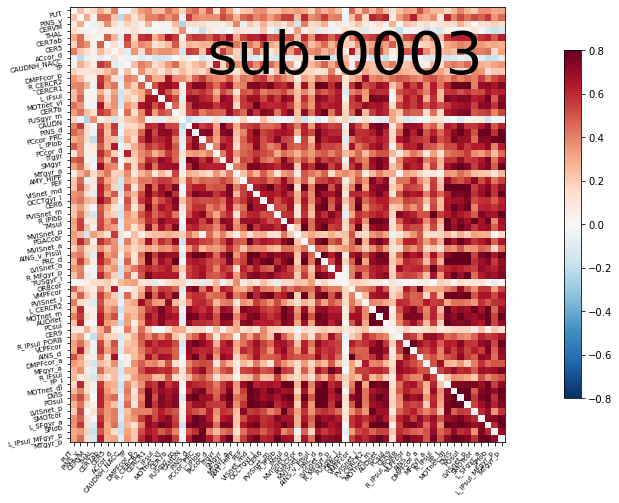

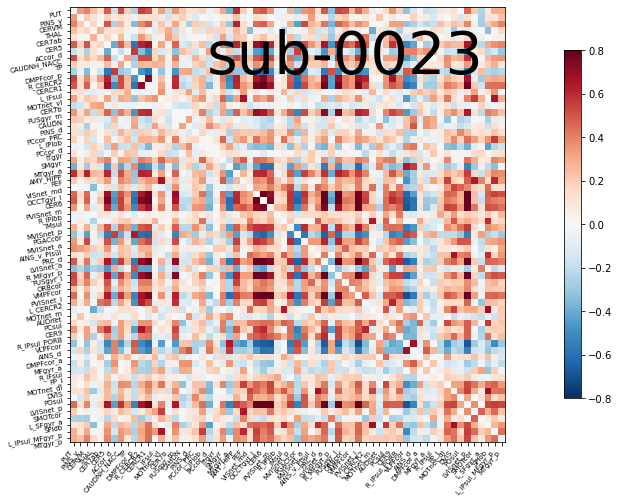

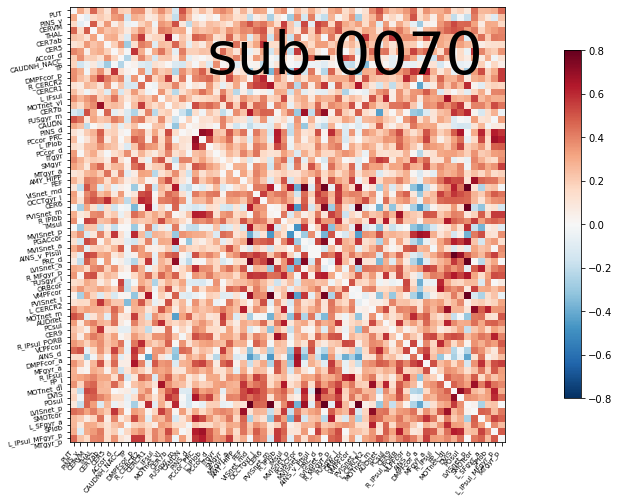

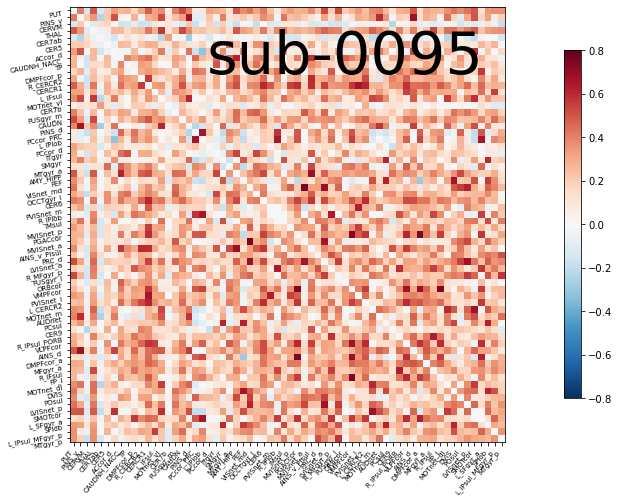

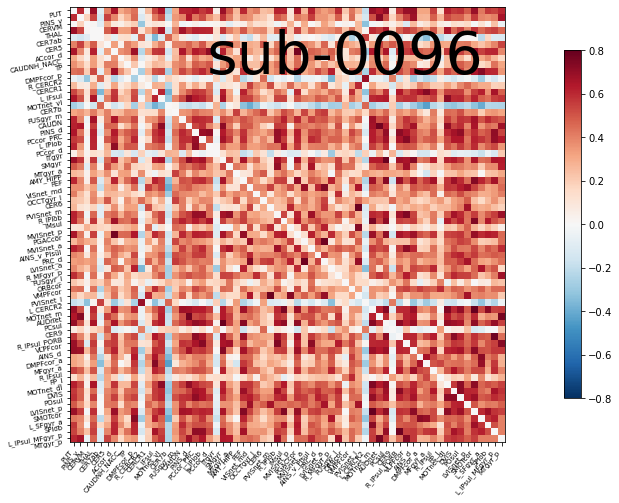

...

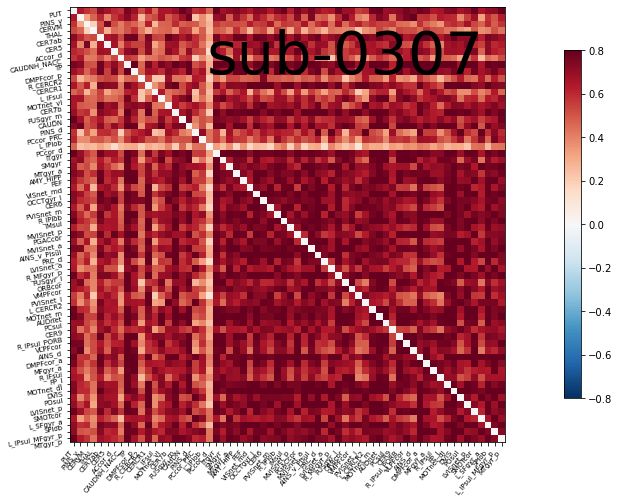

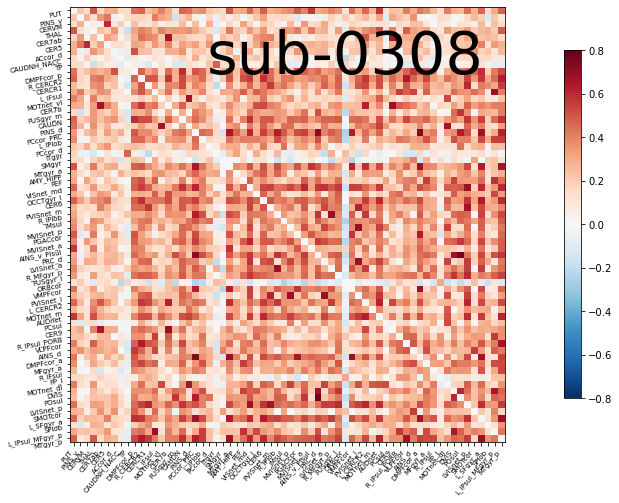

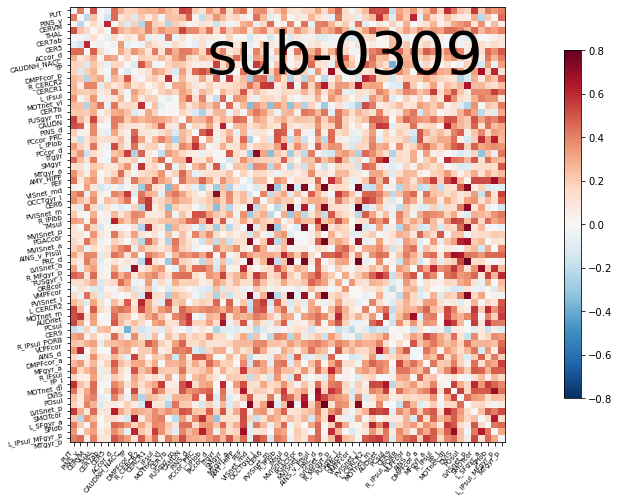

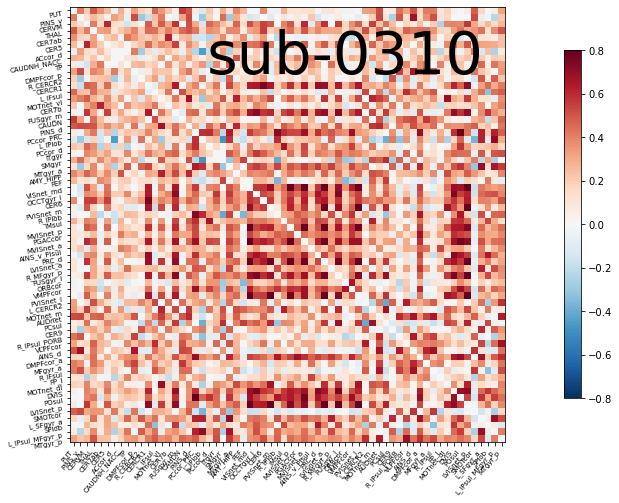

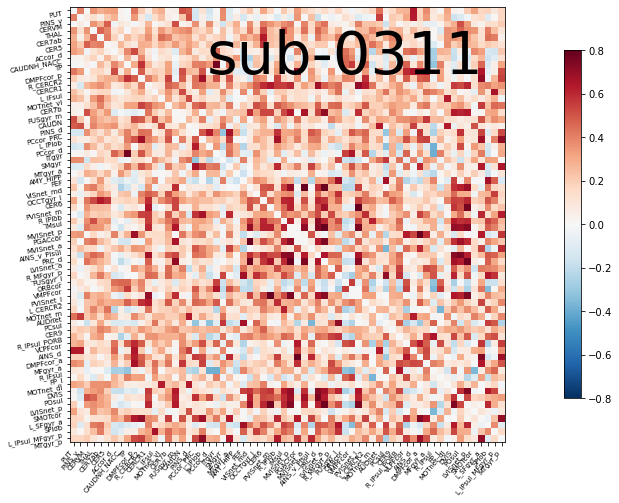

In [84]:
for i in dict_connectome_x:
    plot_matrix(dict_connectome_x[i])

In [14]:
path = "/home/pierre/Documents/export/tfe"

liste_path_sub = glob.glob('{}/sub*/'.format(path))
liste_path_sub = sorted(liste_path_sub)

banlist = []
for i in liste_path_sub:
    if not glob.glob("{}/*/func/*bold.nii.gz".format(i)):
        banlist.append(i[-5:-1])
banlist.append('0200')        
print(banlist)

['0070', '0185', '0205', '0220', '0272', '0273', '0276', '0286', '0291', '0306', '0375', '0394', '0408', '0409', '0416', '0487', '0495', '0588', '0674', '0689', '0710', '0714', '0727', '0200']


In [15]:
liste_sub = []
j = 0
maxi = 16
last = "0000"
for i in liste_path_sub:
    if j < maxi and i[-5:-1] > last and i[-5:-1] not in banlist:
        liste_sub.append(i[-5:-1])
        j = j+1
        
liste_y = liste_sub
liste_path_y = create_path_subj(liste_y)
dict_bold_motionless_y = create_dictbold_motionless(liste_path_y)
dict_connectome_y = create_dict_connectome(dict_bold_motionless_y)



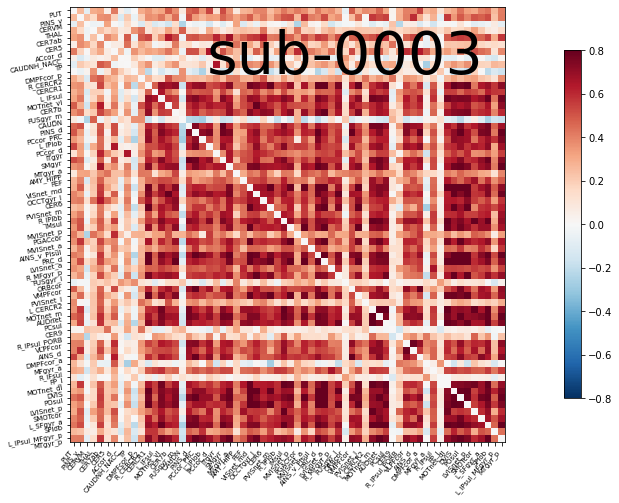

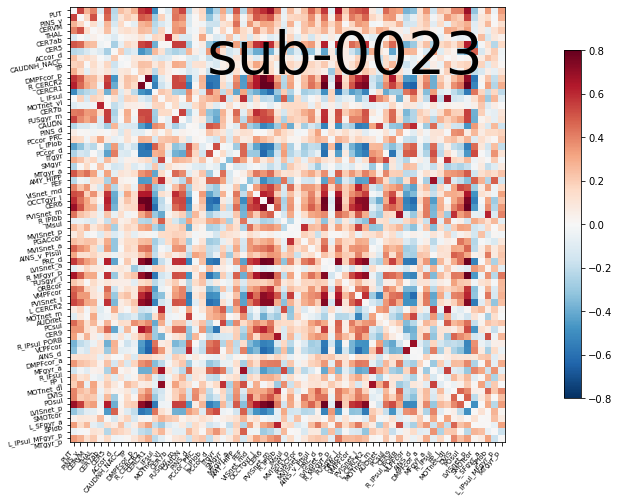

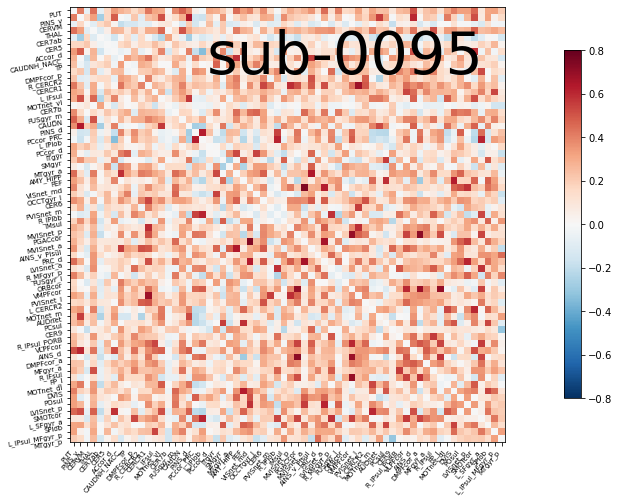

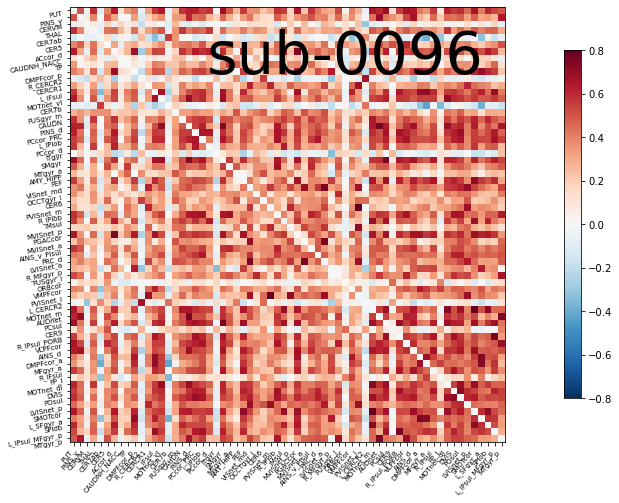

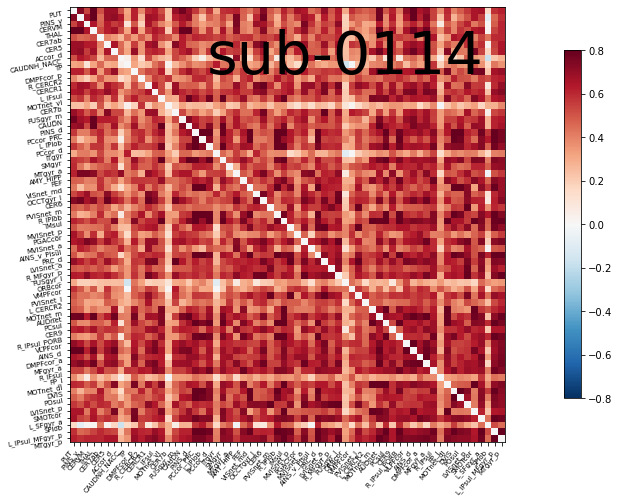

...

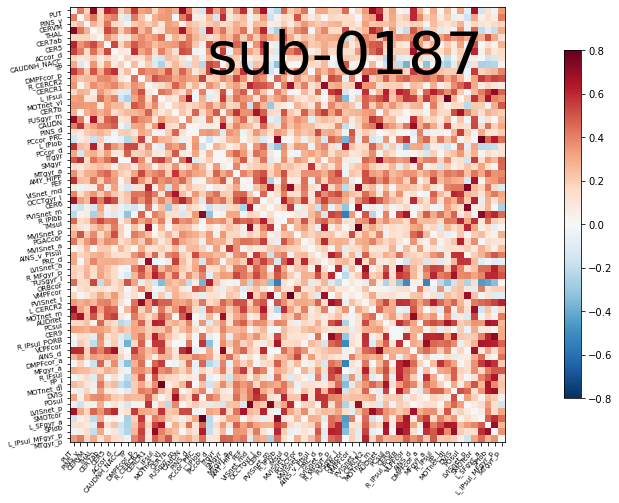

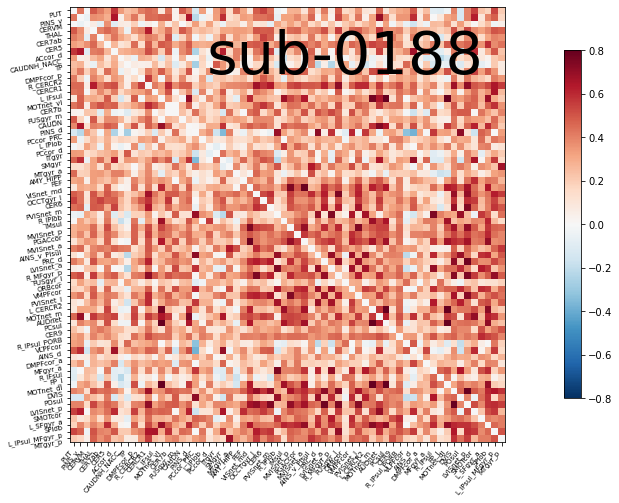

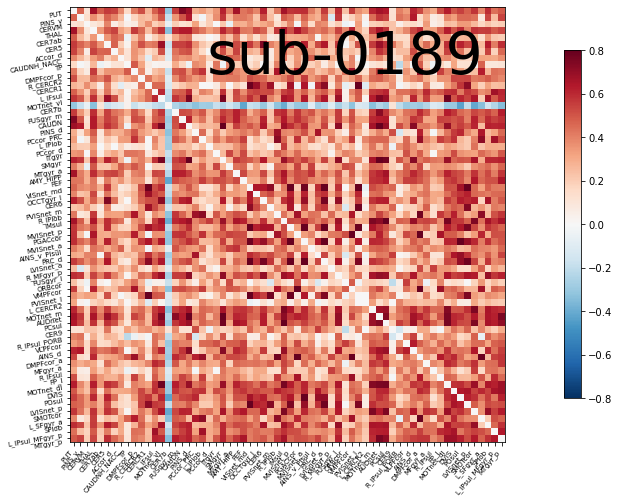

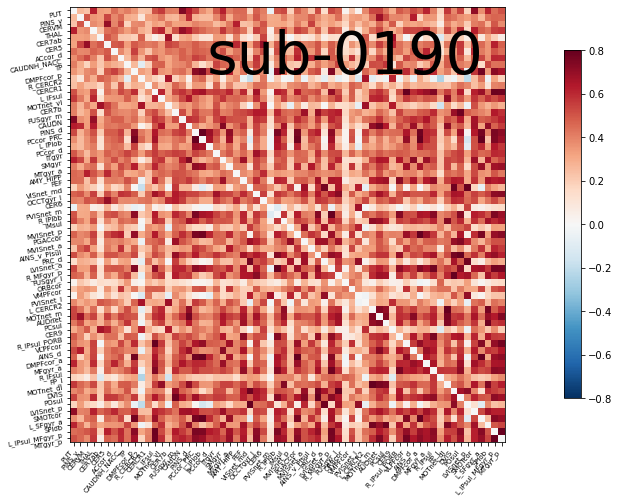

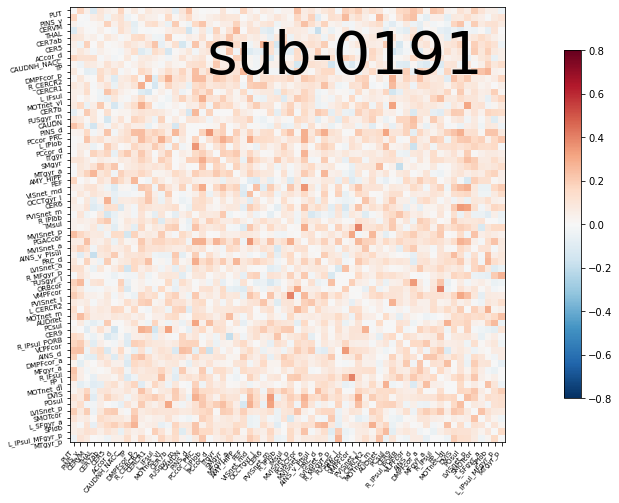

In [16]:
for i in dict_connectome_y:
    plot_matrix(dict_connectome_y[i])

In [30]:
print(dict_bold_motionless_x)

{'sub-0003': '/home/pierre/Documents/export/tfe/sub-0003/ses-02/func/sub-0003_ses-02_task-rest_run-3_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0023': '/home/pierre/Documents/export/tfe/sub-0023/ses-02/func/sub-0023_ses-02_task-rest_run-1_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0095': '/home/pierre/Documents/export/tfe/sub-0095/ses-02/func/sub-0095_ses-02_task-rest_run-2_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0096': '/home/pierre/Documents/export/tfe/sub-0096/ses-02/func/sub-0096_ses-02_task-rest_run-1_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0114': '/home/pierre/Documents/export/tfe/sub-0114/ses-02/func/sub-0114_ses-02_task-rest_run-1_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0132': '/home/pierre/Documents/export/tfe/sub-0132/ses-02/func/sub-0132_ses-02_task-rest_run-1_space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz', 'sub-0178': '/home/pierre/Documents/exp

In [25]:
path_banned = create_path_subj(banlist)

In [31]:
path_banned[0] 

'/home/pierre/Documents/export/tfe/sub-0070'